In [1]:
# Jupyter notebook related
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Imports from eo-learn and sentinelhub-py
from eolearn.core.eoworkflow import LinearWorkflow, Dependency
from eolearn.core.eodata import FeatureType
from sentinelhub import BBox, CRS, MimeType, UtmZoneSplitter, DataSource, constants
from eolearn.core import SaveToDisk, LoadFromDisk
from eolearn.core import EOTask, EOPatch, LinearWorkflow, FeatureType, OverwritePermission, \
    LoadTask, SaveTask, EOExecutor, ExtractBandsTask, MergeFeatureTask
from eolearn.io import SentinelHubWCSInput

# Built-in modules
import pickle
import sys
import os
import datetime
import itertools

# Basics of Python data handling and visualization
import numpy as np
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap, BoundaryNorm
from shapely.geometry import Polygon
from tqdm.auto import tqdm
from PIL import Image, ImageDraw, ImageFont

#deep learning
import tensorflow.compat.v1 as tf

#set random seed
np.random.seed(42)

In [2]:
def load_graph(model):
    print("Creating Graph...")
    detection_graph = tf.Graph()
    with detection_graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(model, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
    return detection_graph

def run_session(sess,image):
    image_np_expanded = np.expand_dims(image, axis=0)
    image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
    box = detection_graph.get_tensor_by_name('detection_boxes:0')
    score = detection_graph.get_tensor_by_name('detection_scores:0')
    clss = detection_graph.get_tensor_by_name('detection_classes:0')
    num_detections = detection_graph.get_tensor_by_name('num_detections:0')
    # Actual detection.
    (box, score, clss, num_detections) = sess.run(
            [box, score, clss, num_detections],
            feed_dict={image_tensor: image_np_expanded})
    return box,score,clss

def draw_bboxes_color(img,boxes,score,clss,color,confidence):
    """
    Draw bounding boxes on top of an image

    Args:
        img : Array of image to be modified
        boxes: An (N,4) array of boxes to draw, where N is the number of boxes.
        classes: An (N,1) array of classes corresponding to each bounding box.

    Outputs:
        An array of the same shape as 'img' with bounding boxes
            and classes drawn

    """
    source = Image.fromarray(img)
    draw = ImageDraw.Draw(source)
    w2,h2 = (img.shape[0],img.shape[1])
    boxes = boxes*img.shape[0]
    boxes = boxes[score >= confidence]
    clss = clss[score>=confidence]
    for i in range(len(boxes)):
        ymin,xmin,ymax,xmax = boxes[i]
        c = clss[i]
        if((float(c)==18.0) | (float(c)>1137.0)):#only cars
            draw.text((xmin+15,ymin+15), str(c))
            draw.rectangle(((xmin, ymin), (xmax, ymax)), outline=color, width=3)
    return source

class ObjectDetectionTask(EOTask):
    """
    The task performs object detection given a tensorflow model (works only for bidimensional temporal data)
    """
    def __init__(self, sess):
        self.sess = sess

    def execute(self, eopatch):

        box_0,score_0,clss_0 = run_session(self.sess,eopatch.data['TRUE-COLOR'][0])
        box_1,score_1,clss_1 = run_session(self.sess,eopatch.data['TRUE-COLOR'][1])
        
        box  =np.append(box_0  ,box_1  , axis=0).reshape(2,250,4,1)
        score=np.append(score_0,score_1, axis=0).reshape(2,250,1,1)
        clss =np.append(clss_0 ,clss_1 , axis=0).reshape(2,250,1,1)
        
        eopatch.add_feature(FeatureType.DATA, "bbox" , box)
        eopatch.add_feature(FeatureType.DATA, "score", score)
        eopatch.add_feature(FeatureType.DATA, "clss" , clss)

        return eopatch

In [3]:
from sentinelhub import SHConfig
INSTANCE_ID = 'da9a30c7-00e2-4dde-88a0-bdcd480e106f'  # In case you put instance ID into configuration file you can leave this unchanged

if INSTANCE_ID:
    config = SHConfig()
    config.instance_id = INSTANCE_ID
else:
    config = None

In [14]:
#user input
path_out = './paris_airport'
#Paris airport
top_left_lat = 49.00463
top_left_long = 2.52192 
bottom_right_lat = 48.98506
bottom_right_long = 2.56608 
coords_wgs84 = [top_left_long, top_left_lat, bottom_right_long, bottom_right_lat]
coords_wgs84 = BBox(bbox=coords_wgs84, crs=CRS.WGS84)
print(coords_wgs84)

2.52192,48.98506,2.56608,49.00463


In [5]:
area = gpd.GeoSeries(coords_wgs84.geometry)
area.crs = "EPSG:4326"
area_shape = area.geometry.values[-1]
type(area) ,type(area_shape), area.crs

(geopandas.geoseries.GeoSeries,
 shapely.geometry.polygon.Polygon,
 <Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

Dimension of the area is 3243 x 2195 m2


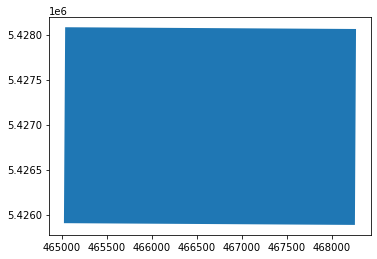

In [6]:
#project
#area = area.to_crs("EPSG:3035")
area = area.to_crs("EPSG:32627")#27N
area = area.to_crs("EPSG:32631")#30N

area_shape = area.geometry.values[-1]
area_shape._crs = area.crs
# Plot
area.plot()
#plt.axis('off');

# Print size
print('Dimension of the area is {0:.0f} x {1:.0f} m2'.format(area_shape.bounds[2] - area_shape.bounds[0],
                                                             area_shape.bounds[3] - area_shape.bounds[1]))

In [7]:
# Create the splitter to obtain a list of bboxes
bbox_splitter = UtmZoneSplitter([area_shape], area.crs, 100)
x_patch=16
y_patch=10
n_x_patch = 2*x_patch+1
n_y_patch = 2*y_patch+1

bbox_list = np.array(bbox_splitter.get_bbox_list())
info_list = np.array(bbox_splitter.get_info_list())

# Prepare info of selected EOPatches
geometry = [Polygon(bbox.get_polygon()) for bbox in bbox_list]
idxs = [info['index'] for info in info_list]
idxs_x = [info['index_x'] for info in info_list]
idxs_y = [info['index_y'] for info in info_list]

gdf = gpd.GeoDataFrame({'index': idxs, 'index_x': idxs_x, 'index_y': idxs_y},
                           crs=area.crs,
                           geometry=geometry)

# select a 5x5 area (id of center patch)
ID = 372

# Obtain surrounding 5x5 patches
patchIDs = []
for idx, [bbox, info] in enumerate(zip(bbox_list, info_list)):
    if (abs(info['index_x'] - info_list[ID]['index_x']) <= x_patch and
        abs(info['index_y'] - info_list[ID]['index_y']) <= y_patch):
        patchIDs.append(idx)

# Check if final size is 5x5
if len(patchIDs) != n_x_patch*n_y_patch:
    print('Warning! Use a different central patch ID, this one is on the border.')

# Change the order of the patches (used for plotting later)
patchIDs = np.transpose(np.fliplr(np.array(patchIDs).reshape(n_x_patch, n_y_patch))).ravel()

# save to shapefile
shapefile_name = './grid_slovenia_500x500.gpkg'
gdf.to_file(shapefile_name, driver='GPKG')

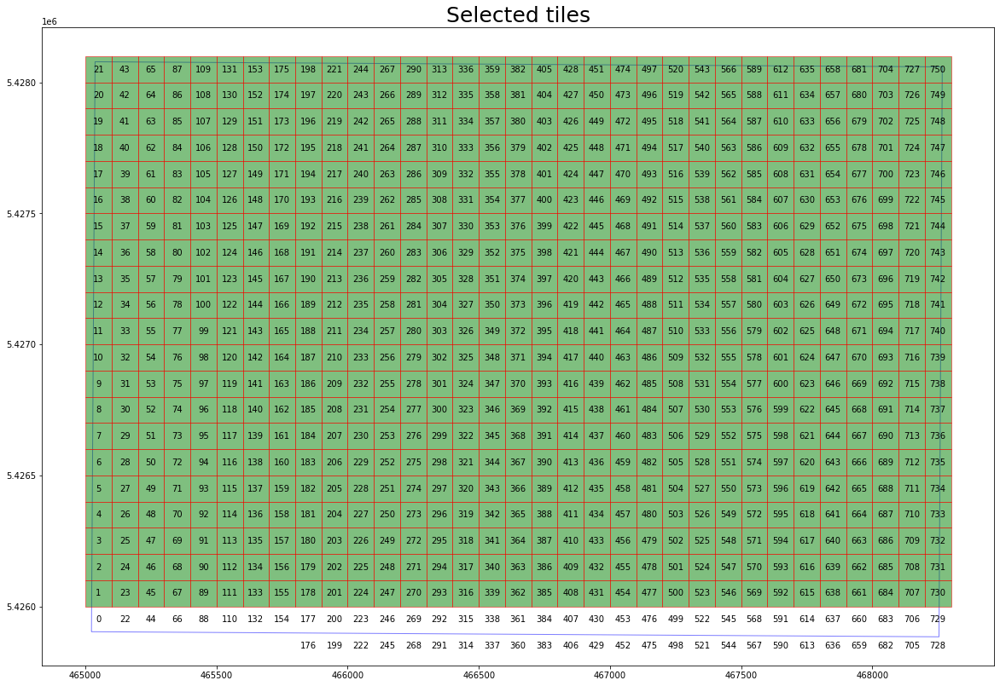

In [8]:
# figure 
fig, ax = plt.subplots(figsize=(20, 20))
area.plot(ax=ax, facecolor='w',edgecolor='b',alpha=0.5)
ax.set_title('Selected tiles', fontsize=25);
for bbox, info in zip(bbox_list, info_list):
    geo = bbox.geometry
    ax.text(geo.centroid.x, geo.centroid.y, info['index'], ha='center', va='center')

gdf[gdf.index.isin(patchIDs)].plot(ax=ax,facecolor='g',edgecolor='r',alpha=0.5)

In [9]:
max(idxs)

750

In [10]:
%%time
#creates eo-patch and run object detection on them
model = "/home/doma/Downloads/xView1_baseline-1.1/models/vanilla.pb"
detection_graph = load_graph(model)
IDs=patchIDs

#creates eopatches
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        #perform the same using EOTask and add count in EOPatch
        #let's load data
        layer = 'TRUE-COLOR'

        collection_id = 'cd0bc245-5d71-41aa-bb72-c09f8e89a53c'

        input_task = SentinelHubWCSInput(
            data_source=DataSource(collection_id),
            layer=layer,
            resx='0.3m',
            resy='0.3m',
            instance_id = 'dd060ae7-b4ff-4576-a1e6-8d5f18514ebf',
            image_format=constants.MimeType.TIFF_d8,
        )
        detection_task = ObjectDetectionTask(
            sess=sess
        )

        save = SaveTask(path_out, overwrite_permission=2, compress_level=1)

        workflow = LinearWorkflow(
            input_task,
            detection_task,
            save
        )
        # Execute the workflow
        time_interval = ('2018-04-01', '2021-05-01')

        # define additional parameters of the workflow
        execution_args = []
        for idx, bbox in enumerate(bbox_list[IDs]):
            execution_args.append({
                input_task:{'bbox': bbox, 'time_interval': time_interval},
                save: {'eopatch_folder': f'eopatch_{idx}'}
            })

        executor = EOExecutor(workflow, execution_args, save_logs=True)
        executor.run(workers=4, multiprocess=False)

Creating Graph...


/home/doma/anaconda3/envs/yolov3-tf2-gpu/lib/python3.7/site-packages/sentinelhub/data_request.py:47: SHDeprecationWarning: Parameter 'instance_id' is deprecated and will soon removed. Use parameter 'config' instead
  category=SHDeprecationWarning)



CPU times: user 31min 43s, sys: 8min 59s, total: 40min 43s
Wall time: 15min 7s


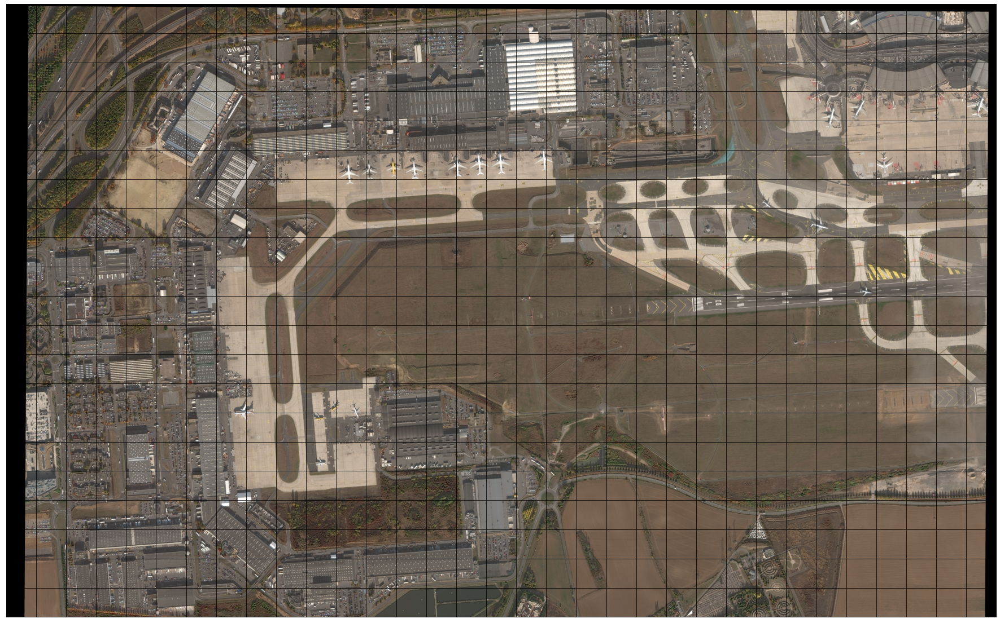

In [15]:
# Draw the RGB image pre covid
fig, axs = plt.subplots(nrows=n_y_patch, ncols=n_x_patch, figsize=(20*n_x_patch/n_y_patch, 20))

for i in tqdm(range(len(patchIDs))):
    eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
    ax = axs[i//n_x_patch][i%n_x_patch]
    dates = np.array(eopatch.timestamp)
    ax.imshow(eopatch.data['TRUE-COLOR'][0])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

In [ ]:
# Draw the RGB image post covid
fig, axs = plt.subplots(nrows=n_y_patch, ncols=n_x_patch, figsize=(20*n_x_patch/n_y_patch, 20))

for i in tqdm(range(len(patchIDs))):
    eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
    ax = axs[i//n_x_patch][i%n_x_patch]
    dates = np.array(eopatch.timestamp)
    ax.imshow(eopatch.data['TRUE-COLOR'][1])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)


CPU times: user 27.1 s, sys: 666 ms, total: 27.8 s
Wall time: 27.7 s


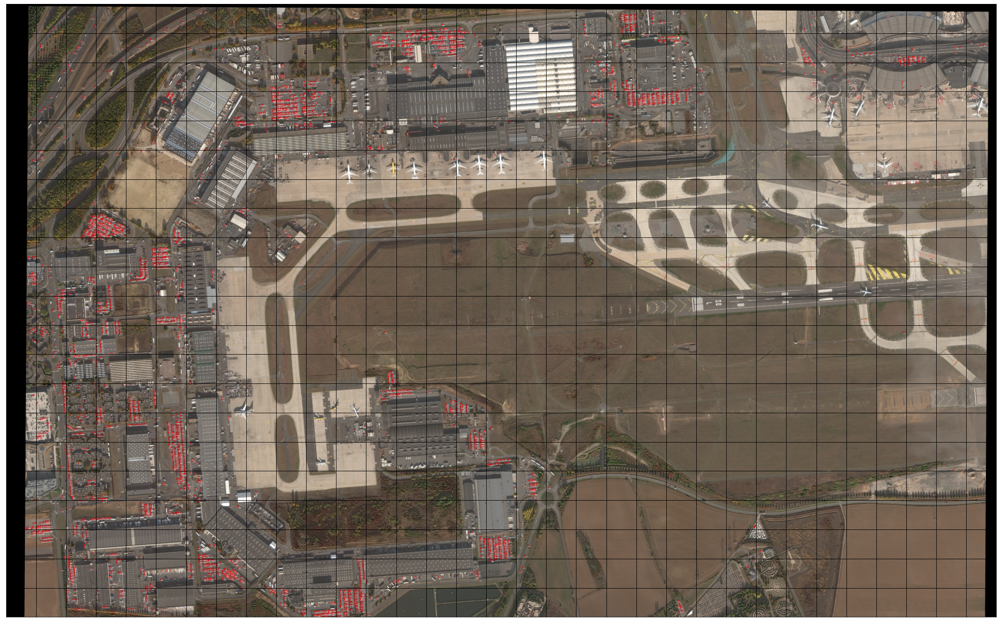

In [16]:
%%time

#Show detections pre covid
tmp_index=0
fig, axs = plt.subplots(nrows=n_y_patch, ncols=n_x_patch, figsize=(20*n_x_patch/n_y_patch, 20))
boxes = []
scores = []
classes = []
k = 0
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        for i in tqdm(range(len(patchIDs))):
            eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
            ax = axs[i//n_x_patch][i%n_x_patch]
            image = eopatch.data['TRUE-COLOR'][tmp_index]
            box = eopatch.data["bbox"][tmp_index,:,:,0]
            score = eopatch.data["score"][tmp_index,:,0,0]
            clss = eopatch.data["clss"][tmp_index,:,0,0]
            bfull = box*image.shape[0]
            conf=0.2
            image_to_plot = draw_bboxes_color(image,box,score,clss,"red",conf)
            ax.imshow(image_to_plot)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_aspect("auto")
            boxes.append(box)
            scores.append(score)
            classes.append(clss)
            del eopatch
fig.subplots_adjust(wspace=0, hspace=0)


CPU times: user 26.2 s, sys: 378 ms, total: 26.5 s
Wall time: 26.4 s


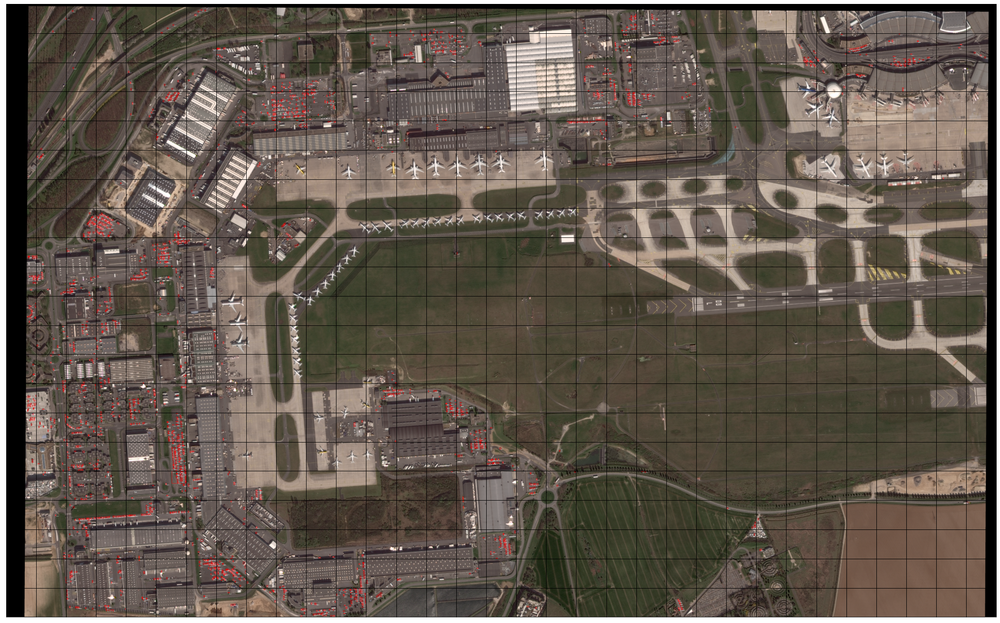

In [17]:
%%time

#Show detections pre covid
tmp_index=1
fig, axs = plt.subplots(nrows=n_y_patch, ncols=n_x_patch, figsize=(20*n_x_patch/n_y_patch, 20))
boxes = []
scores = []
classes = []
k = 0
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        for i in tqdm(range(len(patchIDs))):
            eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
            ax = axs[i//n_x_patch][i%n_x_patch]
            image = eopatch.data['TRUE-COLOR'][tmp_index]
            box = eopatch.data["bbox"][tmp_index,:,:,0]
            score = eopatch.data["score"][tmp_index,:,0,0]
            clss = eopatch.data["clss"][tmp_index,:,0,0]
            bfull = box*image.shape[0]
            conf=0.2
            image_to_plot = draw_bboxes_color(image,box,score,clss,"red",conf)
            ax.imshow(image_to_plot)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_aspect("auto")
            boxes.append(box)
            scores.append(score)
            classes.append(clss)
            del eopatch
fig.subplots_adjust(wspace=0, hspace=0)